In [1]:
#information on the gpu
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue Feb 22 10:21:09 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 471.41       Driver Version: 471.41       CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A    0C    P8    N/A /  N/A |     40MiB /  4096MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
#to time everything
!pip install ipython-autotime
%load_ext autotime

time: 0 ns (started: 2022-02-22 10:21:16 +01:00)


In [3]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

time: 31 ms (started: 2022-02-22 10:21:19 +01:00)


In [4]:
# import different modules
import os
import pandas as pd
import numpy as np
import time
import datetime
import itertools
import glob
import re

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.style as style
style.use('fivethirtyeight')

from skimage import io

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.utils import class_weight

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense,Activation,Input,Dropout,Flatten,Conv2D,MaxPooling2D
from tensorflow.keras.layers import GlobalAveragePooling2D

time: 19.1 s (started: 2022-02-22 10:21:24 +01:00)


In [5]:
#define directory path => adapted to my laptop
root_dir ='C:/Users/sioha/Projet_mushroom/' #project folder path
raw_data_dir = root_dir + 'RAW DATA/' #raw images folder
DL_dir = root_dir + 'Deep_learning/' #Deep Learning folder

# export dir with time stamp to save the results of the Deep Learning
#timestamp = datetime.datetime.now().strftime('%y%m%d_%HH%M')
#export_dir = DL_dir + timestamp + '/'
#os.makedirs(export_dir)
#print(str(export_dir))

time: 0 ns (started: 2022-02-22 10:21:48 +01:00)


In [6]:
print('*'*115)
print('*'*115)

*******************************************************************************************************************
*******************************************************************************************************************
time: 0 ns (started: 2022-02-22 10:21:52 +01:00)


csv file (with json data & images path)

In [7]:
# read the csv file with all information on mushroom
# csv file previously created, based on json files and images
csv_file_paths = 'image_and_json_data.csv'
df_paths = pd.read_csv(root_dir + csv_file_paths)
print('{} rows in the file'.format(len(df_paths)))
df_paths.head()

215410 rows in the file


C:\Users\sioha\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (6,9,12) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,file_name,file_path,resolution,file_year,image_id,format,observation,label,image_url,user,...,gbif_info.canonicalName,gbif_info.phylumKey,gbif_info.class,gbif_info.synonym,gbif_info.scientificName,gbif_info.genus,gbif_info.order,gbif_info.note,gbif_info,json_file
0,1208.jpg,C:/Users/sioha/Projet_mushroom/IMAGES/2006\Aga...,"(243, 320)",2006,1208,jpg,1007,Agaricales,http://mushroomobserver.org/images/320/1208,25,...,Agaricales,34.0,Agaricomycetes,False,Agaricales,NaN,Agaricales,NaN,NaN,JSON\observations_0.json
1,1604.jpg,C:/Users/sioha/Projet_mushroom/IMAGES/2006\Aga...,"(320, 164)",2006,1604,jpg,1535,Agaricales,http://mushroomobserver.org/images/320/1604,43,...,Agaricales,34.0,Agaricomycetes,False,Agaricales,NaN,Agaricales,NaN,NaN,JSON\observations_0.json
2,1608.jpg,C:/Users/sioha/Projet_mushroom/IMAGES/2006\Aga...,"(320, 286)",2006,1608,jpg,1537,Agaricales,http://mushroomobserver.org/images/320/1608,43,...,Agaricales,34.0,Agaricomycetes,False,Agaricales,NaN,Agaricales,NaN,NaN,JSON\observations_0.json
3,29.jpg,C:/Users/sioha/Projet_mushroom/IMAGES/2006\Aga...,"(240, 320)",2006,29,jpg,23,Agaricales,http://mushroomobserver.org/images/320/29,1,...,Agaricales,34.0,Agaricomycetes,False,Agaricales,NaN,Agaricales,NaN,NaN,JSON\observations_0.json
4,680.jpg,C:/Users/sioha/Projet_mushroom/IMAGES/2006\Aga...,"(240, 320)",2006,680,jpg,536,Agaricus,http://mushroomobserver.org/images/320/680,1,...,Agaricus,34.0,Agaricomycetes,False,Agaricus,Agaricus,Agaricales,NaN,NaN,JSON\observations_0.json


time: 3.8 s (started: 2022-02-22 10:21:55 +01:00)


In [8]:
#select only images with resolution (320,240)= (width,height) => main resolution available
df_paths = df_paths[df_paths['resolution']=='(320, 240)']

# drop na on gbif_info.family
df_paths = df_paths[df_paths['gbif_info.family'].notna()]

# keep confidence level over 90 
df_paths = df_paths.loc[df_paths['gbif_info.confidence']>90]

# keep only most common class = 'Agaricomycetes'
top_class = df_paths['gbif_info.class'].value_counts().index[0]
df_paths = df_paths[df_paths['gbif_info.class'] == top_class]
print(df_paths['gbif_info.class'].value_counts())

# Check number of classes 
pd.DataFrame(df_paths.groupby(['gbif_info.family'], as_index=False).size())

Agaricomycetes    74497
Name: gbif_info.class, dtype: int64


,gbif_info.family,size
0,Agaricaceae,5254
1,Albatrellaceae,204
2,Amanitaceae,4769
3,Amylocorticiaceae,16
4,Amylostereaceae,6
...,...,...
99,Tubariaceae,217
100,Tulasnellaceae,37
101,Tulostomataceae,2
102,Typhulaceae,44


time: 360 ms (started: 2022-02-22 10:22:03 +01:00)


In [9]:
# keep only top 7 families 
top_fam = df_paths['gbif_info.family'].value_counts().index[:7].values
df_paths = df_paths[df_paths['gbif_info.family'].isin(top_fam)]

# Check number of images per class 
pd.DataFrame(df_paths.groupby(['gbif_info.family'], as_index=False).size())

,gbif_info.family,size
0,Agaricaceae,5254
1,Amanitaceae,4769
2,Boletaceae,6060
3,Cortinariaceae,4124
4,Russulaceae,6119
5,Strophariaceae,4494
6,Tricholomataceae,4967


time: 93 ms (started: 2022-02-22 10:22:06 +01:00)


In [10]:
# subset col of interest + label encoding
df = df_paths[['file_path','gbif_info.family']].copy()
df['label'] = df['gbif_info.family'].replace(df['gbif_info.family'].unique(),
                                             [*range(len(df['gbif_info.family'].unique()))]).astype(str) 
df.head()

,file_path,gbif_info.family,label
5,C:/Users/sioha/Projet_mushroom/IMAGES/2006\Aga...,Agaricaceae,0
6,C:/Users/sioha/Projet_mushroom/IMAGES/2006\Aga...,Agaricaceae,0
7,C:/Users/sioha/Projet_mushroom/IMAGES/2006\Aga...,Agaricaceae,0
8,C:/Users/sioha/Projet_mushroom/IMAGES/2006\Aga...,Agaricaceae,0
9,C:/Users/sioha/Projet_mushroom/IMAGES/2006\Aga...,Agaricaceae,0


time: 125 ms (started: 2022-02-22 10:22:11 +01:00)


In [11]:
# compute number of classes
print('number of rows = {}'.format(len(df['label'])))
dict_label_df = pd.DataFrame(df.groupby(['label','gbif_info.family'], as_index=False).size())
classes_count = len(dict_label_df)
dict_label_df

number of rows = 35787


,label,gbif_info.family,size
0,0,Agaricaceae,5254
1,1,Strophariaceae,4494
2,2,Amanitaceae,4769
3,3,Boletaceae,6060
4,4,Tricholomataceae,4967
5,5,Cortinariaceae,4124
6,6,Russulaceae,6119


time: 16 ms (started: 2022-02-22 10:22:14 +01:00)


In [12]:
# CREATE DICT LABELS 
dict_label = dict(dict_label_df[['label','gbif_info.family']].values)
dict_label

{'0': 'Agaricaceae',
 '1': 'Strophariaceae',
 '2': 'Amanitaceae',
 '3': 'Boletaceae',
 '4': 'Tricholomataceae',
 '5': 'Cortinariaceae',
 '6': 'Russulaceae'}

time: 0 ns (started: 2022-02-22 10:22:17 +01:00)


In [13]:
print('*'*115)
print('*'*115)

*******************************************************************************************************************
*******************************************************************************************************************
time: 0 ns (started: 2022-02-22 10:22:20 +01:00)


Creation df_train, df_val & df_test for the deep learning model

In [14]:
# Train/test
df_train,df_test=train_test_split(df, train_size=0.8, stratify =df['label'], random_state=42)
# train / val 
df_train_,df_val_=train_test_split(df_train, train_size=0.8,stratify =df_train['label'],random_state=42)
print(df_train_.shape,df_val_.shape,df_test.shape)

(22903, 3) (5726, 3) (7158, 3)
time: 140 ms (started: 2022-02-22 10:22:23 +01:00)


In [15]:
df_test.head()

,file_path,gbif_info.family,label
26647,C:/Users/sioha/Projet_mushroom/IMAGES/2009\Tri...,Tricholomataceae,4
37124,C:/Users/sioha/Projet_mushroom/IMAGES/2010\Inf...,Tricholomataceae,4
197994,C:/Users/sioha/Projet_mushroom/IMAGES/2016\Gym...,Strophariaceae,1
25223,C:/Users/sioha/Projet_mushroom/IMAGES/2009\Rus...,Russulaceae,6
103277,C:/Users/sioha/Projet_mushroom/IMAGES/2013\Bol...,Boletaceae,3


time: 16 ms (started: 2022-02-22 10:22:25 +01:00)


ImageDataGenerator only on the test_data as we will load the final_model which has been previously optimized by Sébastien.

In [16]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_data = ImageDataGenerator().flow_from_dataframe(dataframe = df_test,
                                                     x_col = "file_path",y_col="label", 
                                                     shuffle = False, # to match df_test order 
                                                     target_size=(240,320), # (height,width)
                                                     batch_size=16,
                                                     class_mode='sparse')

Found 7158 validated image filenames belonging to 7 classes.
time: 4.91 s (started: 2022-02-22 10:22:30 +01:00)


RECHARGEMENT DU MODELE PERSONNALISE "efficiennet_final" (sébastien)

ET REVERIFICATION DES RESULTATS

In [17]:
#load the final optimized model
efficientnet_final = tf.keras.models.load_model(root_dir + 'EfficientNetB1_final_model_seb')

time: 54.6 s (started: 2022-02-22 10:22:40 +01:00)


In [18]:
#calculate the class predicted for the test_data 
start=time.time()
test_pred_class=[]
for i in range(448): #448 = len(test_data) / batch_size = 7158 / 16
    test_pred_class_temp = efficientnet_final.predict(test_data[i][0]).argmax(axis = 1) # predictions
    test_pred_class=np.concatenate([test_pred_class,test_pred_class_temp])
total_time=time.time()-start
print('durée totale calcul :',total_time)

durée totale calcul : 814.2706031799316
time: 13min 34s (started: 2022-02-22 10:23:40 +01:00)


In [19]:
#confusion matrix
y_test_class=[]
for i in range(448):
    y_test_class=np.concatenate([y_test_class,test_data[i][1]])
print(metrics.classification_report(y_test_class, test_pred_class))

              precision    recall  f1-score   support

         0.0       0.79      0.76      0.77      1051
         1.0       0.70      0.75      0.72       899
         2.0       0.85      0.82      0.84       954
         3.0       0.86      0.89      0.87      1212
         4.0       0.70      0.66      0.68       993
         5.0       0.66      0.72      0.69       825
         6.0       0.83      0.82      0.82      1224

    accuracy                           0.78      7158
   macro avg       0.77      0.77      0.77      7158
weighted avg       0.78      0.78      0.78      7158

time: 26.9 s (started: 2022-02-22 10:37:36 +01:00)


In [20]:
#save the results in a dataframe
y_test_class_df=pd.DataFrame(y_test_class)
y_test_count=pd.DataFrame(y_test_class_df.value_counts(),columns=['y_test_count'])
y_test_count=y_test_count.sort_index()
test_dict_label=pd.DataFrame(dict_label,index=['family']).transpose()
test_dict_label['y_test_count']=y_test_count['y_test_count'].values
test_dict_label=test_dict_label.reset_index()
test_dict_label=test_dict_label.rename({'index':'label'},axis=1)
test_dict_label

,label,family,y_test_count
0,0,Agaricaceae,1051
1,1,Strophariaceae,899
2,2,Amanitaceae,954
3,3,Boletaceae,1212
4,4,Tricholomataceae,993
5,5,Cortinariaceae,825
6,6,Russulaceae,1224


time: 32 ms (started: 2022-02-22 10:38:19 +01:00)


In [21]:
#save the predictions in a dataframe => it will be used for the gradcam
test_pred_class=pd.DataFrame(test_pred_class)
test_pred_class=test_pred_class.rename({0:'pred_class'},axis=1)
test_pred_class

,pred_class
0,4.0
1,5.0
2,1.0
3,5.0
4,3.0
...,...
7153,0.0
7154,6.0
7155,6.0
7156,2.0


time: 16 ms (started: 2022-02-22 10:38:24 +01:00)


In [22]:
#save the real labels in a dataframe => it will be used for the gradcam
y_test_class_df=y_test_class_df.rename({0:'real_class'},axis=1)
y_test_class_df

,real_class
0,4.0
1,4.0
2,1.0
3,6.0
4,3.0
...,...
7153,0.0
7154,6.0
7155,6.0
7156,2.0


time: 16 ms (started: 2022-02-22 10:38:28 +01:00)


In [23]:
#index selection per class among the good predictions
good_pred_indexes=[]
good_pred_indexes_class0=[]
good_pred_indexes_class1=[]
good_pred_indexes_class2=[]
good_pred_indexes_class3=[]
good_pred_indexes_class4=[]
good_pred_indexes_class5=[]
good_pred_indexes_class6=[]
for i in range(len(test_pred_class['pred_class'])):
    if (test_pred_class['pred_class'].iloc[i]==y_test_class_df['real_class'].iloc[i]):
        good_pred_indexes+=[i]
        if y_test_class_df['real_class'].iloc[i]==0:
            good_pred_indexes_class0+=[i]
        elif y_test_class_df['real_class'].iloc[i]==1:
            good_pred_indexes_class1+=[i]
        elif y_test_class_df['real_class'].iloc[i]==2:
            good_pred_indexes_class2+=[i]
        elif y_test_class_df['real_class'].iloc[i]==3:
            good_pred_indexes_class3+=[i]
        elif y_test_class_df['real_class'].iloc[i]==4:
            good_pred_indexes_class4+=[i]
        elif y_test_class_df['real_class'].iloc[i]==5:
            good_pred_indexes_class5+=[i]
        elif y_test_class_df['real_class'].iloc[i]==6:
            good_pred_indexes_class6+=[i]

time: 813 ms (started: 2022-02-22 10:39:02 +01:00)


In [24]:
print(np.array(good_pred_indexes_class0).size) # number of good predictions in the class0
print(np.array(good_pred_indexes_class1).size) # number of good predictions in the class1
print(np.array(good_pred_indexes_class2).size) # number of good predictions in the class2
print(np.array(good_pred_indexes_class3).size) # number of good predictions in the class3
print(np.array(good_pred_indexes_class4).size) # number of good predictions in the class4
print(np.array(good_pred_indexes_class5).size) # number of good predictions in the class5
print(np.array(good_pred_indexes_class6).size) # number of good predictions in the class6
print(np.array(good_pred_indexes).size) # total number of good predictions

794
672
782
1073
652
591
1001
5565
time: 0 ns (started: 2022-02-22 10:39:08 +01:00)


In [ ]:
#there are 5565 good predictions among a total of 7158 images from test_data
# => 5565/7158 = 78% => we confirmed the accuracy found by Sebastien

In [25]:
#link between label number and family name
family_names=test_dict_label['family']
family_names

0         Agaricaceae
1      Strophariaceae
2         Amanitaceae
3          Boletaceae
4    Tricholomataceae
5      Cortinariaceae
6         Russulaceae
Name: family, dtype: object

time: 0 ns (started: 2022-02-22 10:39:14 +01:00)


Display randomly 3 images per class with a good prediction (1 class per column) among the test_data batch.

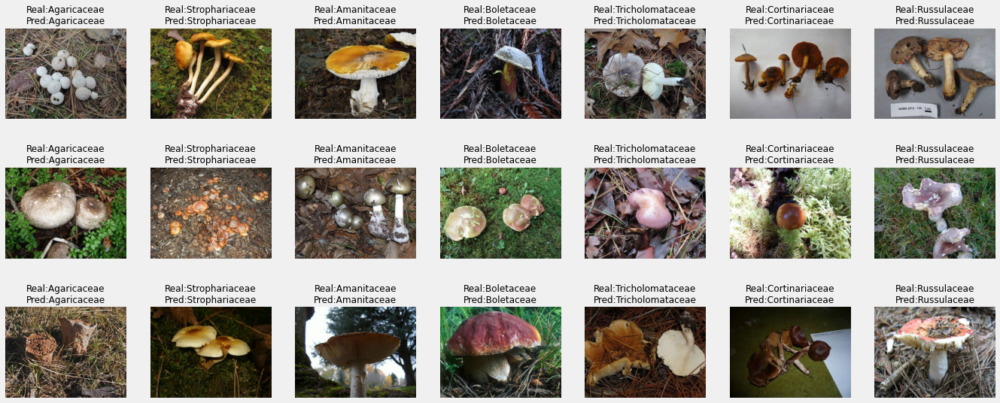

time: 3.3 s (started: 2022-02-22 10:39:19 +01:00)


In [26]:
fig,axs=plt.subplots(3,7,figsize=(21,9))
for col in range(7):
    if col==0:
        row=0
        for i in np.random.choice(good_pred_indexes_class0,size=3):
            batch=i//16
            indice=i%16
            im=np.array(test_data[batch][0][indice],dtype=np.uint8)
            axs[row,col].imshow(im)
            axs[row,col].set_title('Real:'+family_names[col]+'\n'+'Pred:'+family_names[test_pred_class['pred_class'].iloc[i]],fontsize=12)
            axs[row,col].axis('off')
            row+=1
    elif col==1:
        row=0
        for i in np.random.choice(good_pred_indexes_class1,size=3):
            batch=i//16
            indice=i%16
            im=np.array(test_data[batch][0][indice],dtype=np.uint8)
            axs[row,col].imshow(im)
            axs[row,col].set_title('Real:'+family_names[col]+'\n'+'Pred:'+family_names[test_pred_class['pred_class'].iloc[i]],fontsize=12)
            axs[row,col].axis('off')
            row+=1
    elif col==2:
        row=0
        for i in np.random.choice(good_pred_indexes_class2,size=3):
            batch=i//16
            indice=i%16
            im=np.array(test_data[batch][0][indice],dtype=np.uint8)
            axs[row,col].imshow(im)
            axs[row,col].set_title('Real:'+family_names[col]+'\n'+'Pred:'+family_names[test_pred_class['pred_class'].iloc[i]],fontsize=12)
            axs[row,col].axis('off')
            row+=1
    elif col==3:
        row=0
        for i in np.random.choice(good_pred_indexes_class3,size=3):
            batch=i//16
            indice=i%16
            im=np.array(test_data[batch][0][indice],dtype=np.uint8)
            axs[row,col].imshow(im)
            axs[row,col].set_title('Real:'+family_names[col]+'\n'+'Pred:'+family_names[test_pred_class['pred_class'].iloc[i]],fontsize=12)
            axs[row,col].axis('off')
            row+=1
    elif col==4:
        row=0
        for i in np.random.choice(good_pred_indexes_class4,size=3):
            batch=i//16
            indice=i%16
            im=np.array(test_data[batch][0][indice],dtype=np.uint8)
            axs[row,col].imshow(im)
            axs[row,col].set_title('Real:'+family_names[col]+'\n'+'Pred:'+family_names[test_pred_class['pred_class'].iloc[i]],fontsize=12)
            axs[row,col].axis('off')
            row+=1
    elif col==5:
        row=0
        for i in np.random.choice(good_pred_indexes_class5,size=3):
            batch=i//16
            indice=i%16
            im=np.array(test_data[batch][0][indice],dtype=np.uint8)
            axs[row,col].imshow(im)
            axs[row,col].set_title('Real:'+family_names[col]+'\n'+'Pred:'+family_names[test_pred_class['pred_class'].iloc[i]],fontsize=12)
            axs[row,col].axis('off')
            row+=1
    elif col==6:
        row=0
        for i in np.random.choice(good_pred_indexes_class6,size=3):
            batch=i//16
            indice=i%16
            im=np.array(test_data[batch][0][indice],dtype=np.uint8)
            axs[row,col].imshow(im)
            axs[row,col].set_title('Real:'+family_names[col]+'\n'+'Pred:'+family_names[test_pred_class['pred_class'].iloc[i]],fontsize=12)
            axs[row,col].axis('off')
            row+=1
#fig.savefig(root_dir +'Deep_learning/220215_02H39/EfficientNetB1_(240, 320)_7families_all_images_good_pred_examples.jpeg' );

In [27]:
print('*'*115)
print('*'*115)

*******************************************************************************************************************
*******************************************************************************************************************
time: 0 ns (started: 2022-02-22 10:39:29 +01:00)


Create the base_model and apply the weights of the final model

In [108]:
input_tensor = tf.keras.Input(shape=(240,320,3)) #input with the shape of the images to be processed

#base_model = EfficientNetB1 without top layers of classification
from tensorflow.keras.applications import EfficientNetB1
base_model=EfficientNetB1(weights='imagenet',
                          include_top=False,
                          input_tensor = input_tensor)

time: 4.33 s (started: 2022-02-22 12:21:51 +01:00)


In [109]:
#visualisation default weights of base_model
base_model.weights

[<tf.Variable 'normalization_1/mean:0' shape=(3,) dtype=float32, numpy=array([0.485, 0.456, 0.406], dtype=float32)>,
 <tf.Variable 'normalization_1/variance:0' shape=(3,) dtype=float32, numpy=array([0.229, 0.224, 0.225], dtype=float32)>,
 <tf.Variable 'normalization_1/count:0' shape=() dtype=int64, numpy=0>,
 <tf.Variable 'stem_conv/kernel:0' shape=(3, 3, 3, 32) dtype=float32, numpy=
 array([[[[-6.31598294e-01,  1.58087373e-01,  3.36237028e-02,
           -4.10183929e-02, -1.03312828e-01, -1.30804516e-02,
            0.00000000e+00, -9.79949161e-02, -1.20587930e-01,
            8.35960209e-02, -1.30694389e-01, -8.63404572e-02,
            1.28677368e-01,  5.17749727e-01,  4.05013412e-01,
           -1.95988178e-01,  1.57250032e-01,  6.61734521e-01,
            1.62455797e-01,  7.02280551e-04,  4.73497994e-03,
           -1.48393601e-01,  8.51102889e-01, -2.65342355e-01,
            4.04596478e-02,  3.37684080e-02, -1.93432048e-02,
            5.03367111e-02,  2.34500766e-01, -6.1533147

time: 2.02 s (started: 2022-02-22 12:21:59 +01:00)


In [110]:
#display the weights of the first layer of the efficientnet_final model
#this first layer is the EfficientNetB1 model but with the optimized weights (not the 'imagenet' weights)
efficientnet_final.layers[0].weights

[<tf.Variable 'normalization_1/mean:0' shape=(3,) dtype=float32, numpy=array([0.485, 0.456, 0.406], dtype=float32)>,
 <tf.Variable 'normalization_1/variance:0' shape=(3,) dtype=float32, numpy=array([0.229, 0.224, 0.225], dtype=float32)>,
 <tf.Variable 'normalization_1/count:0' shape=() dtype=int64, numpy=0>,
 <tf.Variable 'stem_conv/kernel:0' shape=(3, 3, 3, 32) dtype=float32, numpy=
 array([[[[-6.53248012e-01,  1.75995886e-01,  3.03625911e-02,
           -1.98141504e-02, -1.20325036e-01,  3.43928556e-03,
           -1.12130065e-02, -1.01836741e-01, -1.09501712e-01,
            6.76106364e-02, -1.35203481e-01, -7.70995840e-02,
            1.29777625e-01,  5.31664252e-01,  4.12454367e-01,
           -1.98528662e-01,  1.59868822e-01,  6.83678031e-01,
            1.47451788e-01,  8.18495154e-02, -1.31733576e-03,
           -1.47506014e-01,  8.51327956e-01, -2.77066380e-01,
            3.50941755e-02,  5.74259944e-02, -1.81970485e-02,
            5.10508344e-02,  2.51545817e-01, -6.1764270

time: 1.88 s (started: 2022-02-22 12:22:07 +01:00)


In [111]:
#check that the weights are different at this step
bweights=np.array(base_model.weights,dtype=object)
eweights=np.array(efficientnet_final.layers[0].weights,dtype=object)
print(len(bweights)) #440 expected

egalite=[]
for a, b in zip(bweights, eweights):
    if np.array_equal(a,b):
        egalite.append(1)
    else:
        egalite.append(0)
sum(egalite) #it should be lower than 440

440


279

time: 1.17 s (started: 2022-02-22 12:23:24 +01:00)


In [112]:
#save the weights of the first layer of efficientnet_final model
#uncomment the line command below and adapt the path to save the weights
#efficientnet_final.layers[0].save_weights(root_dir+'EfficientNetB1_final_model_seb_weights/base_model/my_checkpoint')

#apply the weights of the the first layer of efficientnet_final model to the base_model
base_model.load_weights(root_dir+'EfficientNetB1_final_model_seb_weights/base_model/my_checkpoint')
#check the correct application of the weights
base_model.weights

[<tf.Variable 'normalization_1/mean:0' shape=(3,) dtype=float32, numpy=array([0.485, 0.456, 0.406], dtype=float32)>,
 <tf.Variable 'normalization_1/variance:0' shape=(3,) dtype=float32, numpy=array([0.229, 0.224, 0.225], dtype=float32)>,
 <tf.Variable 'normalization_1/count:0' shape=() dtype=int64, numpy=0>,
 <tf.Variable 'stem_conv/kernel:0' shape=(3, 3, 3, 32) dtype=float32, numpy=
 array([[[[-6.53248012e-01,  1.75995886e-01,  3.03625911e-02,
           -1.98141504e-02, -1.20325036e-01,  3.43928556e-03,
           -1.12130065e-02, -1.01836741e-01, -1.09501712e-01,
            6.76106364e-02, -1.35203481e-01, -7.70995840e-02,
            1.29777625e-01,  5.31664252e-01,  4.12454367e-01,
           -1.98528662e-01,  1.59868822e-01,  6.83678031e-01,
            1.47451788e-01,  8.18495154e-02, -1.31733576e-03,
           -1.47506014e-01,  8.51327956e-01, -2.77066380e-01,
            3.50941755e-02,  5.74259944e-02, -1.81970485e-02,
            5.10508344e-02,  2.51545817e-01, -6.1764270

time: 5.19 s (started: 2022-02-22 12:23:43 +01:00)


In [113]:
#check that the weights are the same at this step
bweights=np.array(base_model.weights,dtype=object)
eweights=np.array(efficientnet_final.layers[0].weights,dtype=object)
print(len(bweights)) #440 expected

egalite=[]
for a, b in zip(bweights, eweights):
    if np.array_equal(a,b):
        egalite.append(1)
    else:
        egalite.append(0)
sum(egalite) #it should be 440

440


440

time: 1.17 s (started: 2022-02-22 12:24:19 +01:00)


In [114]:
#display the layers of the base_model
base_model.summary()

Model: "efficientnetb1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 240, 320, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_1 (Rescaling)        (None, 240, 320, 3)  0           ['input_2[0][0]']                
                                                                                                  
 normalization_1 (Normalization  (None, 240, 320, 3)  7          ['rescaling_1[0][0]']            
 )                                                                                                
                                                                                     

Total params: 6,575,239
Trainable params: 6,513,184
Non-trainable params: 62,055
__________________________________________________________________________________________________
time: 188 ms (started: 2022-02-22 12:24:31 +01:00)


In [115]:
#display the layers of the efficientnet_final model
efficientnet_final.summary()

Model: "EFB1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb1 (Functional)  (None, 8, 10, 1280)      6575239   
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 1024)              1311744   
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                              

Create a new model with the API function in order to able to reach the "top_conv" layer

In [146]:
efficientnet_final.get_config()

C:\Users\sioha\anaconda3\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


{'name': 'EFB1',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 240, 320, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'efficientnetb1_input'}},
  {'class_name': 'Functional',
   'config': {'name': 'efficientnetb1',
    'layers': [{'class_name': 'InputLayer',
      'config': {'batch_input_shape': (None, 240, 320, 3),
       'dtype': 'float32',
       'sparse': False,
       'ragged': False,
       'name': 'input_2'},
      'name': 'input_2',
      'inbound_nodes': []},
     {'class_name': 'Rescaling',
      'config': {'name': 'rescaling_1',
       'trainable': True,
       'dtype': 'float32',
       'scale': 0.00392156862745098,
       'offset': 0.0},
      'name': 'rescaling_1',
      'inbound_nodes': [[['input_2', 0, 0, {}]]]},
     {'class_name': 'Normalization',
      'config': {'name': 'normalization_1',
       'trainable': True,
       'dtype': 'float32',
       'axis': (3,),
       'mean': None,
       'var

time: 312 ms (started: 2022-02-22 16:34:19 +01:00)


In [170]:
from tensorflow.keras.layers import BatchNormalization, Activation
last_conv = base_model.get_layer('top_conv') #identify the last convolution layer

#define the model from the last_conv layer
#all the layers are the same as the customised efficientnet classification top layers
#with weights from efficientnet_final
x=BatchNormalization(weights=base_model.layers[-2].weights)(last_conv.output)
x=Activation('swish',weights=base_model.layers[-1].weights)(x)
x= GlobalAveragePooling2D(weights=efficientnet_final.layers[1].weights)(x)
x= Dense(1024, activation='relu',weights=efficientnet_final.layers[2].weights)(x)
x= Dropout(0.3,weights=efficientnet_final.layers[3].weights)(x)
x= Dense(512, activation='relu',weights=efficientnet_final.layers[4].weights)(x)
x= Dropout(0.2,weights=efficientnet_final.layers[5].weights)(x)
x= Dense(7, activation='softmax',weights=efficientnet_final.layers[6].weights)(x)
new_model = tf.keras.models.Model(inputs=input_tensor, outputs=x)

time: 78 ms (started: 2022-02-22 17:25:26 +01:00)


In [171]:
#check that the weights are the same at this step
nweights=np.array(new_model.weights,dtype=object)
eweights=np.array(efficientnet_final.weights,dtype=object)
print(len(eweights)) #446 expected

egalite=[]
for a, b in zip(nweights, eweights):
    if np.array_equal(a,b):
        egalite.append(1)
    else:
        egalite.append(0)
sum(egalite) #it should be 446

446


446

time: 687 ms (started: 2022-02-22 17:25:35 +01:00)


In [172]:
#calculate the class predicted for the test_data 
start=time.time()
test_pred_class_new=[]
for i in range(448): #448 = len(test_data) / batch_size = 7158 / 16
    test_pred_class_temp = new_model.predict(test_data[i][0]).argmax(axis = 1) # predictions
    test_pred_class_new=np.concatenate([test_pred_class_new,test_pred_class_temp])
total_time=time.time()-start
print('durée totale calcul :',total_time)

durée totale calcul : 558.8387432098389
time: 9min 18s (started: 2022-02-22 17:26:09 +01:00)


In [173]:
#confusion matrix
y_test_class_new=[]
for i in range(448):
    y_test_class_new=np.concatenate([y_test_class_new,test_data[i][1]])
print(metrics.classification_report(y_test_class_new, test_pred_class_new))

              precision    recall  f1-score   support

         0.0       0.79      0.76      0.77      1051
         1.0       0.70      0.75      0.72       899
         2.0       0.85      0.82      0.84       954
         3.0       0.86      0.89      0.87      1212
         4.0       0.70      0.66      0.68       993
         5.0       0.66      0.72      0.69       825
         6.0       0.83      0.82      0.82      1224

    accuracy                           0.78      7158
   macro avg       0.77      0.77      0.77      7158
weighted avg       0.78      0.78      0.78      7158

time: 11.8 s (started: 2022-02-22 17:35:49 +01:00)


In [ ]:
#confirmation that the performances results of the new_model are the same as
#the performances results of the efficientnet_final model

In [174]:
print('*'*115)
print('*'*115)

*******************************************************************************************************************
*******************************************************************************************************************
time: 15 ms (started: 2022-02-22 17:37:26 +01:00)


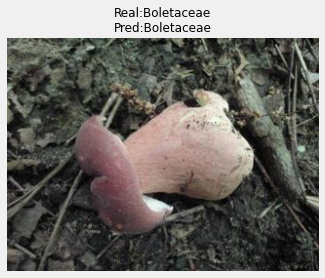

time: 141 ms (started: 2022-02-22 17:37:37 +01:00)


In [175]:
# display image to be used for the gradcam
# manually chosen among the class3 (class3 has obtained the best f1-score)
indice=good_pred_indexes_class3[6] #7th index of the list of good predictions of the class3
batch=indice//16 #operation "//16" as the test_data was divided into batches of 16 images
i=indice%16 #to obtain the real index of the test_data 

fig=plt.figure()
im=np.array(test_data[batch][0][i],dtype=np.uint8) #[batch][0][index]
plt.imshow(im)
plt.title('Real:'+family_names[3]+'\n'+'Pred:'+family_names[test_pred_class['pred_class'].iloc[indice]],fontsize=12)
plt.axis('off');

In [176]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

# Display
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm

time: 0 ns (started: 2022-02-22 17:37:43 +01:00)


In [177]:
#function to preprocessed correctly the image
def get_img_array(img):
    array = keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

# Prepare the selected image
img_array = get_img_array(img=im)
img_array.shape

(1, 240, 320, 3)

time: 0 ns (started: 2022-02-22 17:37:46 +01:00)


In [184]:
#label prediction of img_array with the efficientnet_final model
result_efficientnet_final=efficientnet_final(img_array)
print(result_efficientnet_final)
tf.argmax(efficientnet_final(img_array),axis=1).numpy()

tf.Tensor(
[[2.0245171e-08 2.3893611e-07 2.3060998e-11 9.9932468e-01 2.1813800e-07
  1.3270203e-07 6.7473168e-04]], shape=(1, 7), dtype=float32)


array([3], dtype=int64)

time: 531 ms (started: 2022-02-22 17:42:22 +01:00)


In [185]:
#load again the final optimized model
efficientnet_final2 = tf.keras.models.load_model(root_dir + 'EfficientNetB1_final_model_seb')

#check that the results are exactly the same for the same image
result_efficientnet_final_2=efficientnet_final2(img_array)
print(result_efficientnet_final_2)
tf.argmax(efficientnet_final2(img_array),axis=1).numpy()

tf.Tensor(
[[2.0245171e-08 2.3893611e-07 2.3060998e-11 9.9932468e-01 2.1813800e-07
  1.3270203e-07 6.7473168e-04]], shape=(1, 7), dtype=float32)


array([3], dtype=int64)

time: 19.1 s (started: 2022-02-22 17:42:29 +01:00)


In [186]:
result_efficientnet_final==result_efficientnet_final_2

<tf.Tensor: shape=(1, 7), dtype=bool, numpy=array([[ True,  True,  True,  True,  True,  True,  True]])>

time: 0 ns (started: 2022-02-22 17:42:51 +01:00)


In [ ]:
#confirmation that the performances results of the EfficientNetB1_final_model_seb are always the same
#whatever the number of times it is loaded

In [187]:
#label prediction of img_array with the new_model
result_new_model=new_model(img_array)
print(result_new_model)
tf.argmax(new_model(img_array),axis=1).numpy()

tf.Tensor(
[[2.0245171e-08 2.3893611e-07 2.3060998e-11 9.9932468e-01 2.1813800e-07
  1.3270203e-07 6.7473168e-04]], shape=(1, 7), dtype=float32)


array([3], dtype=int64)

time: 547 ms (started: 2022-02-22 17:42:58 +01:00)


In [188]:
result_efficientnet_final==result_new_model

<tf.Tensor: shape=(1, 7), dtype=bool, numpy=array([[ True,  True,  True,  True,  True,  True,  True]])>

time: 0 ns (started: 2022-02-22 17:43:02 +01:00)


In [ ]:
#confirmation that the performances results of the EfficientNetB1_final_model_seb are the same as
#the performances results of the new_model

In [ ]:
#Check if the performances results of the new_model (API functional) remain the same
#whatever the number of times it is created

In [189]:
last_conv = base_model.get_layer('top_conv') #identify the last convolution layer

#define the model from the last_conv layer
#all the layers are the same as the customised efficientnet classification top layers
#with weights from efficientnet_final
x=BatchNormalization(weights=base_model.layers[-2].weights)(last_conv.output)
x=Activation('swish',weights=base_model.layers[-1].weights)(x)
x= GlobalAveragePooling2D(weights=efficientnet_final.layers[1].weights)(x)
x= Dense(1024, activation='relu',weights=efficientnet_final.layers[2].weights)(x)
x= Dropout(0.3,weights=efficientnet_final.layers[3].weights)(x)
x= Dense(512, activation='relu',weights=efficientnet_final.layers[4].weights)(x)
x= Dropout(0.2,weights=efficientnet_final.layers[5].weights)(x)
x= Dense(7, activation='softmax',weights=efficientnet_final.layers[6].weights)(x)
new_model_2 = tf.keras.models.Model(inputs=input_tensor, outputs=x)

time: 78 ms (started: 2022-02-22 17:45:48 +01:00)


In [190]:
#check that the weights are the same at this step
nweights_2=np.array(new_model_2.weights,dtype=object)
eweights=np.array(efficientnet_final.weights,dtype=object)
print(len(eweights)) #446 expected

egalite=[]
for a, b in zip(nweights_2, eweights):
    if np.array_equal(a,b):
        egalite.append(1)
    else:
        egalite.append(0)
sum(egalite) #it should be 446

446


446

time: 671 ms (started: 2022-02-22 17:46:44 +01:00)


In [191]:
#calculate the class predicted for the test_data 
start=time.time()
test_pred_class_new_2=[]
for i in range(448): #448 = len(test_data) / batch_size = 7158 / 16
    test_pred_class_temp = new_model_2.predict(test_data[i][0]).argmax(axis = 1) # predictions
    test_pred_class_new_2=np.concatenate([test_pred_class_new_2,test_pred_class_temp])
total_time=time.time()-start
print('durée totale calcul :',total_time)

durée totale calcul : 565.163946390152
time: 9min 25s (started: 2022-02-22 17:47:37 +01:00)


In [192]:
#confusion matrix
y_test_class_new_2=[]
for i in range(448):
    y_test_class_new_2=np.concatenate([y_test_class_new_2,test_data[i][1]])
print(metrics.classification_report(y_test_class_new_2, test_pred_class_new_2))

              precision    recall  f1-score   support

         0.0       0.79      0.76      0.77      1051
         1.0       0.70      0.75      0.72       899
         2.0       0.85      0.82      0.84       954
         3.0       0.86      0.89      0.87      1212
         4.0       0.70      0.66      0.68       993
         5.0       0.66      0.72      0.69       825
         6.0       0.83      0.82      0.82      1224

    accuracy                           0.78      7158
   macro avg       0.77      0.77      0.77      7158
weighted avg       0.78      0.78      0.78      7158

time: 12.2 s (started: 2022-02-22 17:58:22 +01:00)


In [193]:
#label prediction of img_array with the new_model_2
result_new_model_2=new_model_2(img_array)
print(result_new_model_2)
tf.argmax(new_model_2(img_array),axis=1).numpy()

tf.Tensor(
[[2.0245171e-08 2.3893611e-07 2.3060998e-11 9.9932468e-01 2.1813800e-07
  1.3270203e-07 6.7473168e-04]], shape=(1, 7), dtype=float32)


array([3], dtype=int64)

time: 532 ms (started: 2022-02-22 18:00:21 +01:00)


In [194]:
result_efficientnet_final==result_new_model_2

<tf.Tensor: shape=(1, 7), dtype=bool, numpy=array([[ True,  True,  True,  True,  True,  True,  True]])>

time: 16 ms (started: 2022-02-22 18:00:43 +01:00)


In [ ]:
#confirmation that the performances results of the EfficientNetB1_final_model_seb are the same as
#the performances results of the new_model_2

In [195]:
print('*'*115)
print('*'*115)

*******************************************************************************************************************
*******************************************************************************************************************
time: 15 ms (started: 2022-02-22 18:01:49 +01:00)


In [197]:
#function to calculate the heatmap of the image output at the "top_conv" layer
def make_gradcam_heatmap(img_array, model, last_conv_name):
    grad_model = Model([model.inputs],[model.get_layer(name=last_conv_name).output,model.output])
    with tf.GradientTape() as tape:
        last_conv_layer_output,preds = grad_model(img_array)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

time: 0 ns (started: 2022-02-22 18:05:21 +01:00)


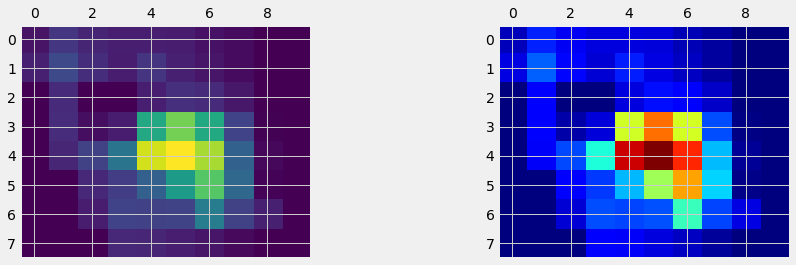

time: 1.12 s (started: 2022-02-22 18:05:25 +01:00)


In [198]:
# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, new_model,'top_conv')
jet = cm.get_cmap("jet")

# Display heatmap with 2 cmap
fig=plt.figure(figsize=(14,4))
ax = plt.subplot(1,2,1)
plt.matshow(heatmap,0) #original cmap
ax = plt.subplot(1,2,2)
plt.matshow(heatmap,0,cmap=jet) #cmap = jet; it will be the one used for the surimposed image
plt.show()

Interpretation of the heatmap:
- at this step the shape is (8,10) correponding to the output shape of the "top_conv" layer
- with the original cmap:
    - dark purple means that the pixel has got a low value, which means a low probability to be actived
    - yellow means that the pixel has got a high value, which means a high probability to be actived
- with the jet cmap:
    - brown/red means that the pixel has got a low value, which means a low probability to be actived
    - blue means that the pixel has got a high value, which means a high probability to be actived

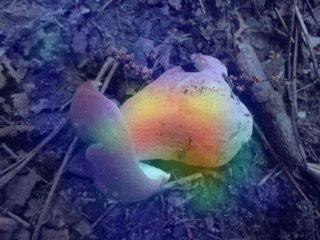

time: 31 ms (started: 2022-02-22 18:05:37 +01:00)


In [199]:
# Rescale heatmap to a range 0-255
heatmap = np.uint8(255 * heatmap)

# Use jet colormap to colorize heatmap (blue for low values and red for high values)
jet = cm.get_cmap("jet")

# Use RGB values of the colormap
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap]

# Create an image with RGB colorized heatmap
jet_heatmap=keras.preprocessing.image.array_to_img(jet_heatmap)
jet_heatmap=jet_heatmap.resize((img_array.shape[2], img_array.shape[1])) #apply same resolution as the image
jet_heatmap=keras.preprocessing.image.img_to_array(jet_heatmap)

# Superimpose the heatmap on original image
superimposed_img = jet_heatmap * 0.4 + img_array[0] #0.4 = transparency of the heatmap
superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

# Save the superimposed image
superimposed_img.save("cam.jpg")

# Display Grad CAM
display(Image("cam.jpg"))

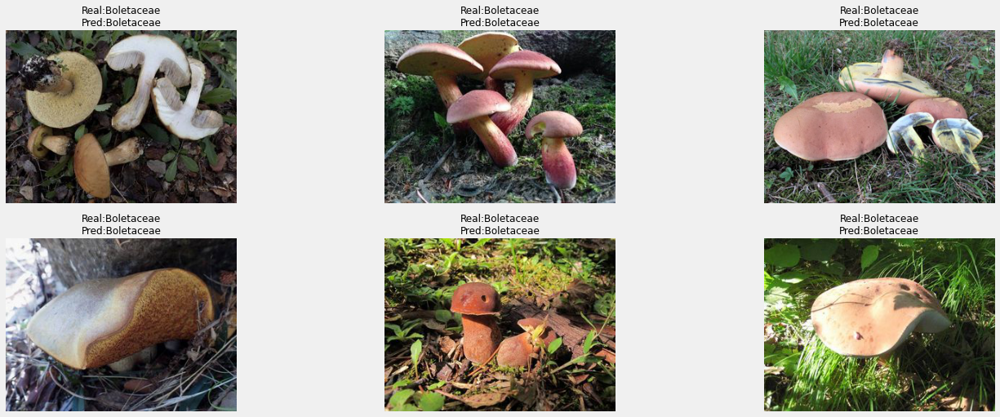

time: 515 ms (started: 2022-02-22 18:05:57 +01:00)


In [200]:
# choose randomly 6 images with a good prediction among the class3 (best f1-score)
fig=plt.figure(figsize=(21,8))
k=1
list_indices_class3=[]
list_batch=[]
list_batch_indice=[]
for i in np.random.choice(good_pred_indexes_class3,size=6): #choose 6 images
    indice=i
    list_indices_class3.append(indice)#save the index for the grad-cam
    batch=indice//16
    list_batch.append(batch) #save the batch for the grad-cam
    j=indice%16
    list_batch_indice.append(j) #save the index of the batch for the grad-cam
    im=np.array(test_data[batch][0][j],dtype=np.uint8) #[batch][0][indice]
    
    #display the original images
    ax = plt.subplot(2,3,k)
    plt.imshow(im)
    label=str('Real:'+family_names[3]+'\n'+'Pred:'+family_names[test_pred_class['pred_class'].iloc[indice]])
    plt.title(label,size=12)
    plt.axis('off')
    k+=1

In [201]:
#display the index of the 6 chosen images
print(list_indices_class3)
print(list_batch)
print(list_batch_indice)

[1321, 5026, 4592, 1161, 2826, 3667]
[82, 314, 287, 72, 176, 229]
[9, 2, 0, 9, 10, 3]
time: 0 ns (started: 2022-02-22 18:06:04 +01:00)


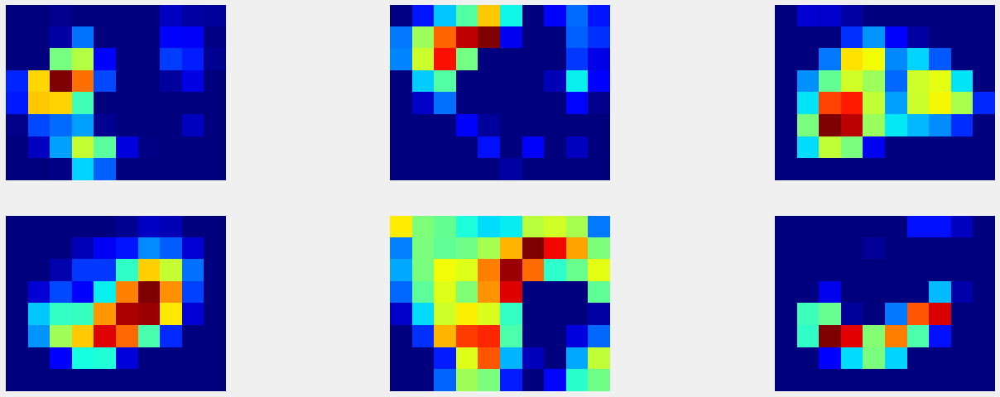

time: 4.94 s (started: 2022-02-22 18:06:10 +01:00)


In [202]:
#display heatmap for the 6 chosen images
fig=plt.figure(figsize=(21,8))
k=1
list_heatmap=[]
list_img_array=[]
for indice,batch,batch_indice in zip(list_indices_class3,list_batch,list_batch_indice):
    im=np.array(test_data[batch][0][batch_indice],dtype=np.uint8) #load image
    img_array = get_img_array(img=im) #prepare image
    list_img_array.append(img_array)
    heatmap = make_gradcam_heatmap(img_array, new_model,'top_conv') # Generate class activation heatmap
    list_heatmap.append(heatmap) #save heatmap for display image+gradcam
    
    # Display heatmap
    ax = plt.subplot(2,3,k)
    plt.matshow(heatmap,0,cmap=jet)
    plt.axis('off')
    k+=1

In [203]:
def display_gradcam(img_array,heatmap):
    heatmap = np.uint8(255 * heatmap) # Rescale heatmap to a range 0-255
    jet = cm.get_cmap("jet") # get jet colormap
    jet_colors = jet(np.arange(256))[:, :3] # apply jet colormap on the 3 RGB columns
    jet_heatmap = jet_colors[heatmap] # set jet colormap to colorize heatmap

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img_array.shape[2], img_array.shape[1]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.4 + img_array[0]
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)
    #superimposed_img.save("gradcam.jpg") # Save the superimposed image

    # Display Grad CAM
    #display(Image("gradcam.jpg"))
    return superimposed_img

time: 0 ns (started: 2022-02-22 18:06:26 +01:00)


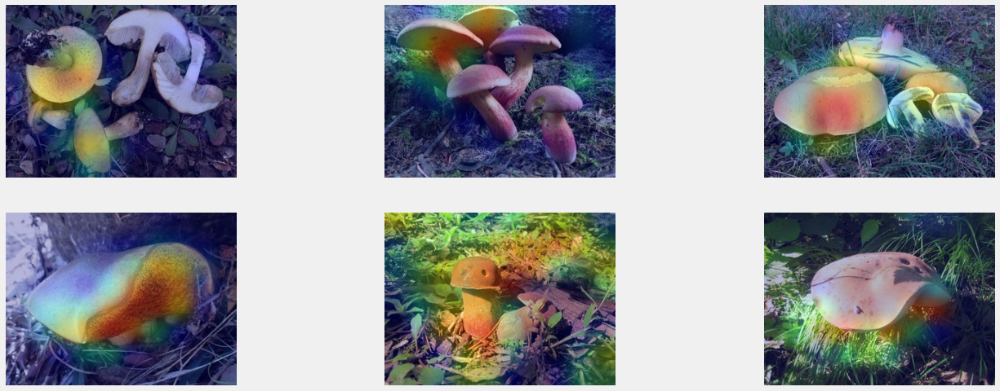

time: 391 ms (started: 2022-02-22 18:06:30 +01:00)


In [204]:
#display grad-cam of the 6 chosen images
fig=plt.figure(figsize=(21,8))
k=1
for img_array,heatmap in zip(list_img_array,list_heatmap):
    img=display_gradcam(img_array,heatmap)
    plt.subplot(2,3,k)
    plt.imshow(img)
    plt.axis('off')
    k+=1
plt.show()

The grad-cam results show that identify pretty well the pixels corresponding visually to the mushroom to calculate the prediction of the family class.

Limitations:
- when there are several mushrooms on the same image, the model does not always identify them all. But, as the goal is to identify the mushroom and not the number of mushrooms it should have a small impact
- we can see that sometimes (5th image), the pixels activated/used are identifying the mushroom itself, but also the surrounding

In [205]:
print('*'*115)
print('*'*115)

*******************************************************************************************************************
*******************************************************************************************************************
time: 0 ns (started: 2022-02-22 18:10:33 +01:00)


Application of the gradcam on another list of 6 images, but this time among the class2 (2nd best f1-score)

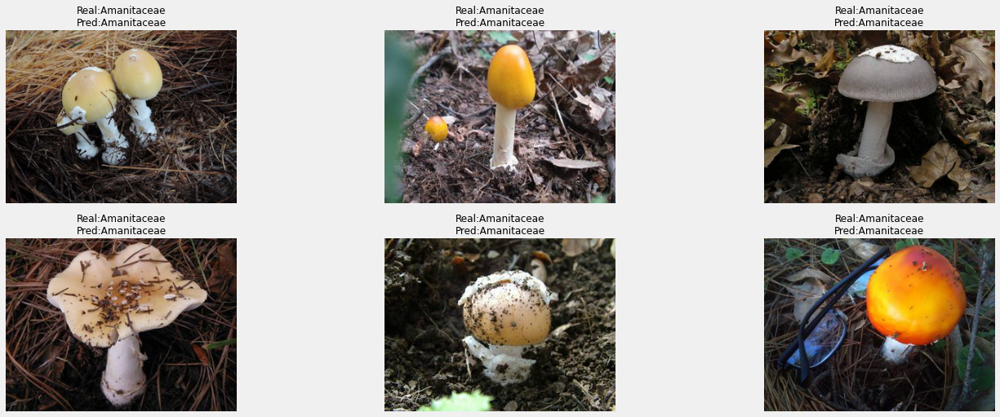

time: 532 ms (started: 2022-02-22 18:10:51 +01:00)


In [206]:
# 6 images chosen randomly among the good predictions of the class2
fig=plt.figure(figsize=(21,8))
k=1
list_indices_class2=[]
list_batch2=[]
list_batch2_indice=[]
for i in np.random.choice(good_pred_indexes_class2,size=6):
    indice=i
    list_indices_class2.append(indice)
    batch=indice//16
    list_batch2.append(batch)
    j=indice%16
    list_batch2_indice.append(j)
    im=np.array(test_data[batch][0][j],dtype=np.uint8) #[batch][0][indice]
    
    #display the image
    ax = plt.subplot(2,3,k)
    plt.imshow(im)
    label=str('Real:'+family_names[2]+'\n'+'Pred:'+family_names[test_pred_class['pred_class'].iloc[indice]])
    plt.title(label,size=12)
    plt.axis('off')
    k+=1

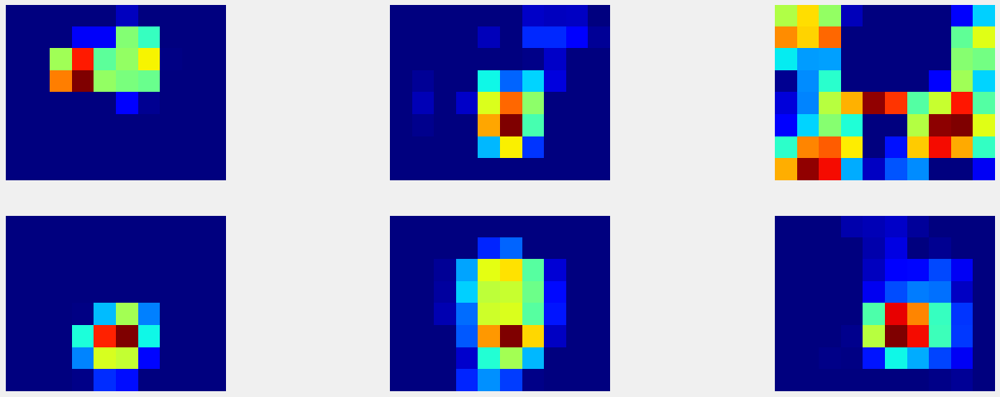

time: 4.94 s (started: 2022-02-22 18:11:02 +01:00)


In [207]:
#display the heatmaps
fig=plt.figure(figsize=(21,8))
k=1
list_heatmap2=[]
list_img_array2=[]
for indice,batch,batch_indice in zip(list_indices_class2,list_batch2,list_batch2_indice):
    im=np.array(test_data[batch][0][batch_indice],dtype=np.uint8) #load image
    img_array = get_img_array(img=im) #prepare image
    list_img_array2.append(img_array)
    heatmap = make_gradcam_heatmap(img_array, new_model,'top_conv') # Generate class activation heatmap
    list_heatmap2.append(heatmap) #save heatmap for display image+gradcam
    
    # Display heatmap
    ax = plt.subplot(2,3,k)
    plt.matshow(heatmap,0,cmap=jet)
    plt.axis('off')
    k+=1

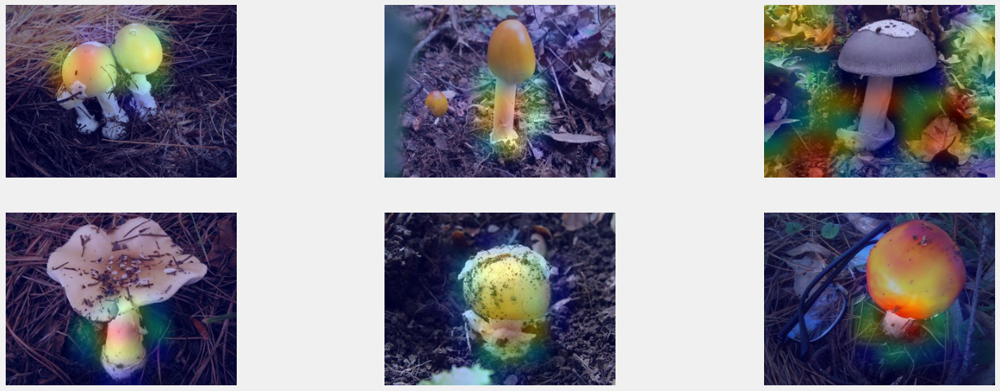

time: 406 ms (started: 2022-02-22 18:11:15 +01:00)


In [208]:
#display grad-cam of the 6 chosen images
fig=plt.figure(figsize=(21,8))
k=1
for img_array,heatmap in zip(list_img_array2,list_heatmap2):
    img=display_gradcam(img_array,heatmap)
    plt.subplot(2,3,k)
    plt.imshow(img)
    plt.axis('off')
    k+=1
plt.show()

Same comments as for the class3

In [209]:
print('*'*115)
print('*'*115)

*******************************************************************************************************************
*******************************************************************************************************************
time: 0 ns (started: 2022-02-22 18:11:47 +01:00)


Application of the gradcam on another list of 6 images, but this time among the class4 (worst f1-score at 0.68)

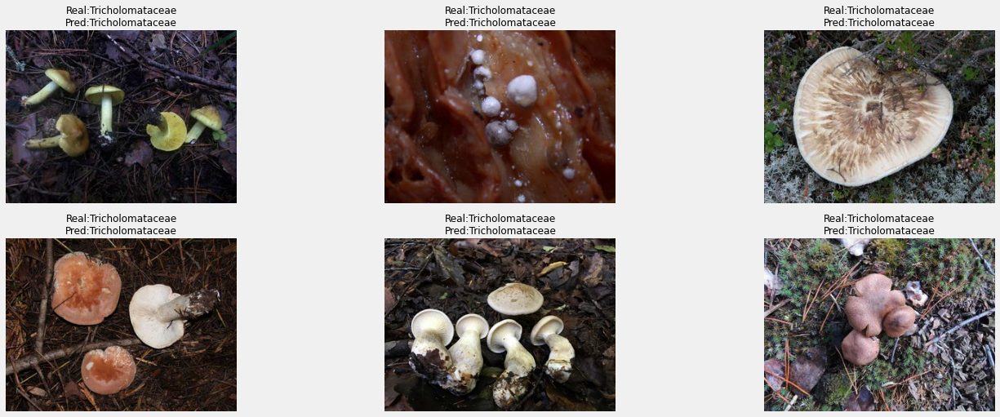

time: 532 ms (started: 2022-02-22 18:11:54 +01:00)


In [210]:
# 6 images chosen randomly among the good predictions of the class2
fig=plt.figure(figsize=(21,8))
k=1
list_indices_class4=[]
list_batch4=[]
list_batch4_indice=[]
for i in np.random.choice(good_pred_indexes_class4,size=6):
    indice=i
    list_indices_class4.append(indice)
    batch=indice//16
    list_batch4.append(batch)
    j=indice%16
    list_batch4_indice.append(j)
    im=np.array(test_data[batch][0][j],dtype=np.uint8) #[batch][0][indice]
    
    #display the image
    ax = plt.subplot(2,3,k)
    plt.imshow(im)
    label=str('Real:'+family_names[4]+'\n'+'Pred:'+family_names[test_pred_class['pred_class'].iloc[indice]])
    plt.title(label,size=12)
    plt.axis('off')
    k+=1

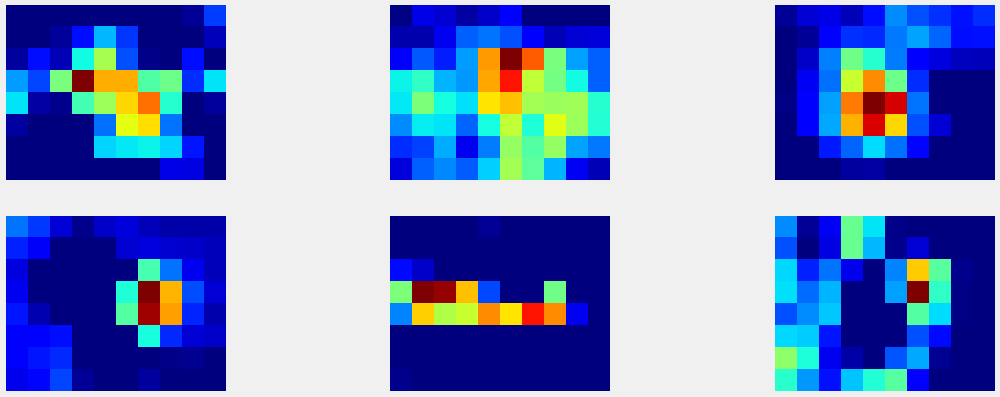

time: 4.95 s (started: 2022-02-22 18:11:59 +01:00)


In [211]:
#display the heatmaps
fig=plt.figure(figsize=(21,8))
k=1
list_heatmap4=[]
list_img_array4=[]
for indice,batch,batch_indice in zip(list_indices_class4,list_batch4,list_batch4_indice):
    im=np.array(test_data[batch][0][batch_indice],dtype=np.uint8) #load image
    img_array = get_img_array(img=im) #prepare image
    list_img_array4.append(img_array)
    heatmap = make_gradcam_heatmap(img_array, new_model,'top_conv') # Generate class activation heatmap
    list_heatmap4.append(heatmap) #save heatmap for display image+gradcam
    
    # Display heatmap
    ax = plt.subplot(2,3,k)
    plt.matshow(heatmap,0,cmap=jet)
    plt.axis('off')
    k+=1

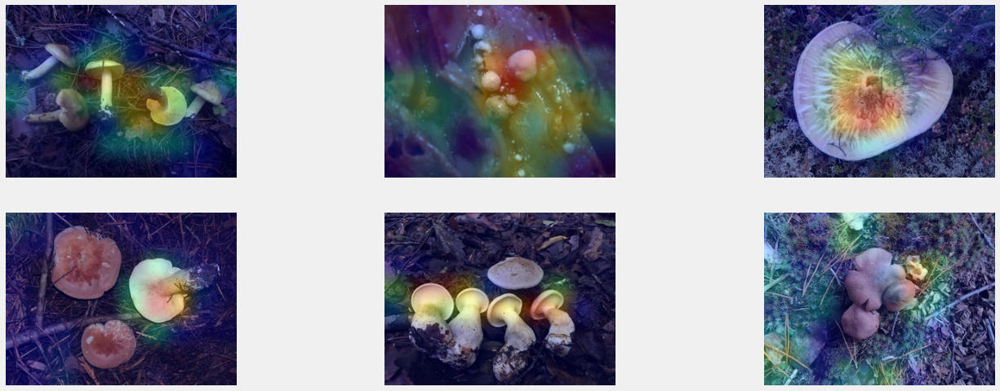

time: 422 ms (started: 2022-02-22 18:12:13 +01:00)


In [212]:
#display grad-cam of the 6 chosen images
fig=plt.figure(figsize=(21,8))
k=1
for img_array,heatmap in zip(list_img_array4,list_heatmap4):
    img=display_gradcam(img_array,heatmap)
    plt.subplot(2,3,k)
    plt.imshow(img)
    plt.axis('off')
    k+=1
plt.show()

Grad-cam results: same comments as for the class 3 & 2

In [213]:
print('*'*115)
print('*'*115)
print('*'*115)
print('*'*115)

*******************************************************************************************************************
*******************************************************************************************************************
*******************************************************************************************************************
*******************************************************************************************************************
time: 0 ns (started: 2022-02-22 18:12:25 +01:00)


Investigation to display the heatmap of the same image but for each family class

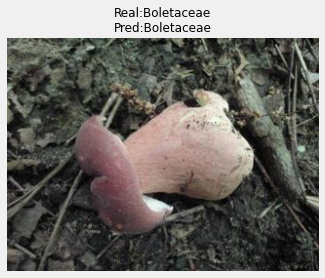

time: 125 ms (started: 2022-02-22 18:12:34 +01:00)


In [214]:
# image manually chosen among the class3 (best f1-score)
indice=good_pred_indexes_class3[6]
batch=indice//16
i=indice%16

#display original image
fig=plt.figure()
im=np.array(test_data[batch][0][i],dtype=np.uint8) #[batch][0][indice]
plt.imshow(im)
plt.title('Real:'+family_names[3]+'\n'+'Pred:'+family_names[test_pred_class['pred_class'].iloc[indice]],fontsize=12)
plt.axis('off');

In [215]:
# Prepare image
img_array = get_img_array(img=im)
img_array.shape

(1, 240, 320, 3)

time: 0 ns (started: 2022-02-22 18:12:41 +01:00)


In [216]:
print('*'*115)
print('*'*115)

*******************************************************************************************************************
*******************************************************************************************************************
time: 0 ns (started: 2022-02-22 18:12:44 +01:00)


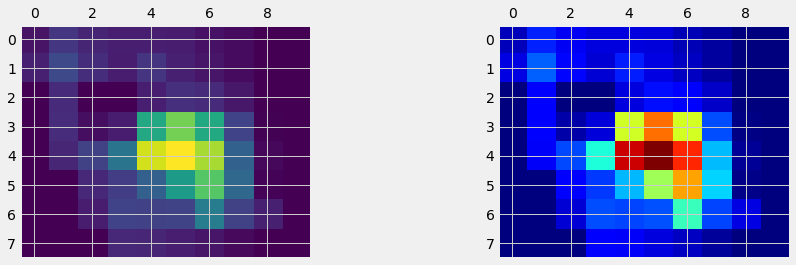

time: 969 ms (started: 2022-02-22 18:12:54 +01:00)


In [217]:
# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, new_model,'top_conv')
jet = cm.get_cmap("jet")

# Display heatmap with 2 cmap
fig=plt.figure(figsize=(14,4))
ax = plt.subplot(1,2,1)
plt.matshow(heatmap,0) #original cmap
ax = plt.subplot(1,2,2)
plt.matshow(heatmap,0,cmap=jet) #cmap = jet; it will be the one used for the surimposed image
plt.show()

In [218]:
def make_gradcam_heatmap_class(img_array, model, last_conv_name,pred_index):
    grad_model = Model([model.inputs],[model.get_layer(name=last_conv_name).output,model.output])
    with tf.GradientTape() as tape:
        last_conv_layer_output,preds = grad_model(img_array)
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

time: 0 ns (started: 2022-02-22 18:13:00 +01:00)


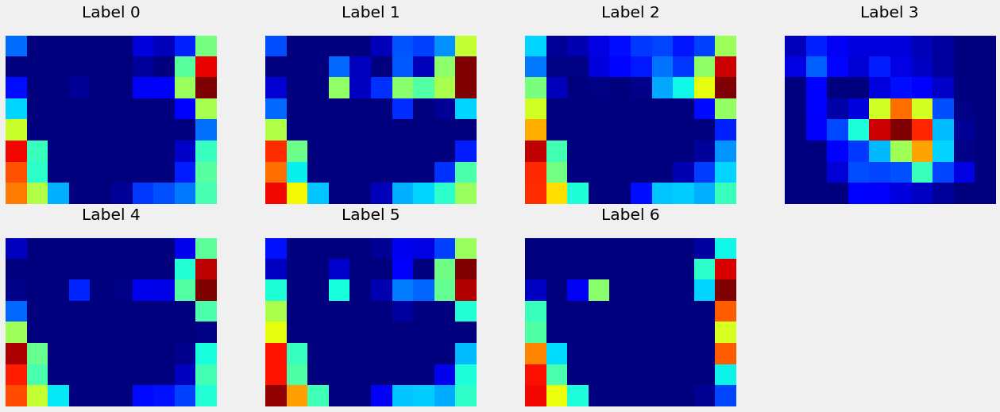

time: 5.47 s (started: 2022-02-22 18:13:04 +01:00)


In [219]:
# Generate class activation heatmap
list_heatmap=[]
for pred_index in range(7):
    heatmap = make_gradcam_heatmap_class(img_array, new_model,'top_conv',pred_index)
    list_heatmap.append(heatmap)

#display heatmap for the 7 predicted classes from the same image
fig=plt.figure(figsize=(20,8))
k=1
for heatmap in list_heatmap:
    plt.subplot(2,4,k)
    plt.matshow(heatmap,0,cmap=jet)
    plt.title('Label '+str(k-1))
    plt.axis('off')
    k+=1
plt.show()

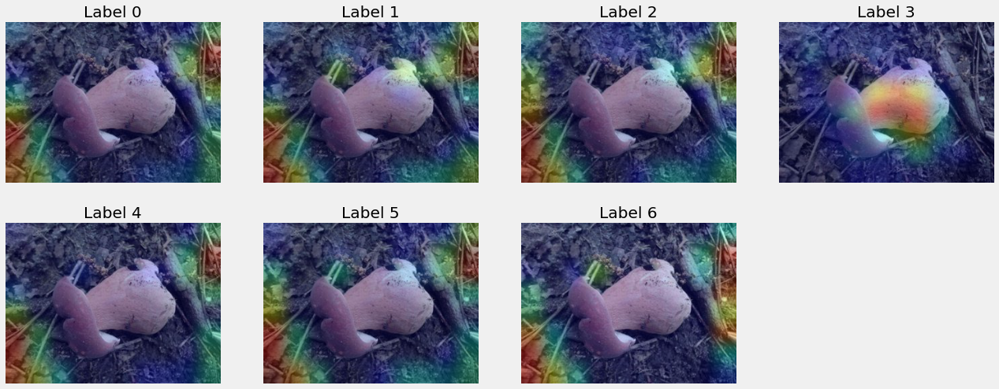

time: 438 ms (started: 2022-02-22 18:13:13 +01:00)


In [220]:
fig=plt.figure(figsize=(20,8))
k=1
for heatmap in list_heatmap:
    img_class=display_gradcam(img_array,heatmap)
    plt.subplot(2,4,k)
    plt.imshow(img_class)
    plt.title('Label '+str(k-1))
    plt.axis('off')
    k+=1
plt.show()

In [221]:
print('*'*115)
print('*'*115)

*******************************************************************************************************************
*******************************************************************************************************************
time: 0 ns (started: 2022-02-22 18:13:35 +01:00)


In [ ]:
#results with new_model_2

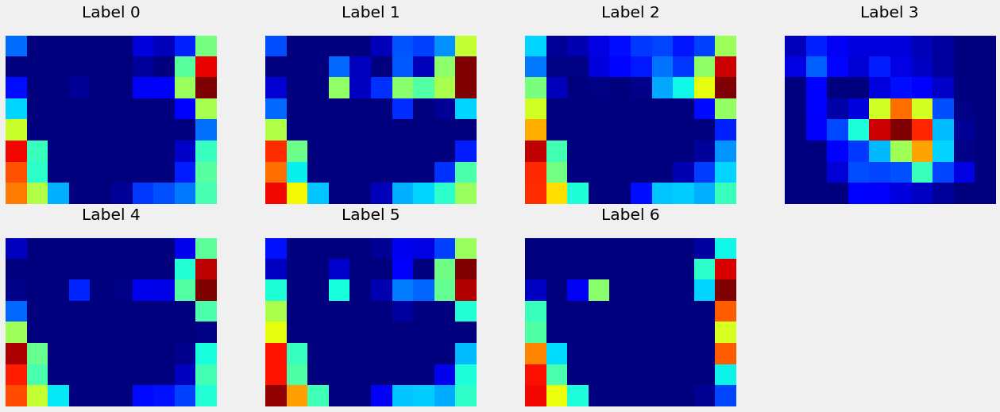

time: 5.58 s (started: 2022-02-22 18:14:20 +01:00)


In [222]:
# Generate class activation heatmap
list_heatmap_2=[]
for pred_index in range(7):
    heatmap = make_gradcam_heatmap_class(img_array, new_model_2,'top_conv',pred_index)
    list_heatmap_2.append(heatmap)

#display heatmap for the 7 predicted classes from the same image
fig=plt.figure(figsize=(20,8))
k=1
for heatmap in list_heatmap_2:
    plt.subplot(2,4,k)
    plt.matshow(heatmap,0,cmap=jet)
    plt.title('Label '+str(k-1))
    plt.axis('off')
    k+=1
plt.show()

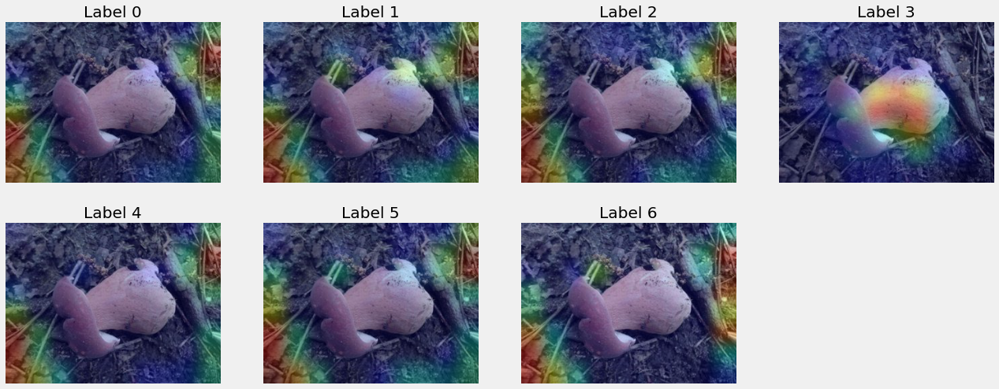

time: 438 ms (started: 2022-02-22 18:14:38 +01:00)


In [223]:
fig=plt.figure(figsize=(20,8))
k=1
for heatmap in list_heatmap_2:
    img_class=display_gradcam(img_array,heatmap)
    plt.subplot(2,4,k)
    plt.imshow(img_class)
    plt.title('Label '+str(k-1))
    plt.axis('off')
    k+=1
plt.show()

In [ ]:
#confirmation that the results are the same with the new_model and new_model_2